# Performing Exploratory Data Analysis on Basketball Data 
> The dataset consist of all home and away games for each NBA team from the 2017-2018 to 2022-2023 seasons. 
<br> We will want to explore the following:
<br> 1. Home vs. Away differentials for each team
<br> 2. Identify if there are any teams with a better away record than home
<br> 3. Top home and away teams for each season
<br> 4. Metrics that contribute towards losses in away games
<br> 5. Are home or away record a better indicator of success

Loading the necessary packages

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
plt.style.use('ggplot')


pd.options.display.max_rows = 100
pd.options.display.max_columns = 999

### Importing our dataset

In [2]:
# GET THE ABSOLUTE FILEPATH 
ROOT_DIR = os.path.abspath('') 
FILEPATH = os.path.join(ROOT_DIR, 'Kaggle Datasets', 'game_scores.csv') 
#print(FILEPATH)

basketball_data = pd.read_csv(FILEPATH)

basketball_data.drop(['Unnamed: 0', 'MATCHID'], axis=1, inplace=True)
basketball_data['DATE'] = pd.to_datetime(basketball_data['DATE'])

### Exploring the dataset:
1. View the structure of the original dataset (e.g., # of rows, # of cols, column datatypes)
2. View the columns and identify if there are any columns that aren't necessary for analysis
3. Check each column for any missing/null values


#### 7059 rows & 42 cols

In [3]:
basketball_data.shape

(7059, 40)

In [4]:
basketball_data.columns

Index(['DATE', 'SEASON', 'HOME', 'AWAY', 'W_HOME', 'W_AWAY', 'HOME_FG',
       'AWAY_FG', 'HOME_FGA', 'AWAY_FGA', 'HOME_FG_PCT', 'AWAY_FG_PCT',
       'HOME_FG3', 'AWAY_FG3', 'HOME_FG3A', 'AWAY_FG3A', 'HOME_FG3_PCT',
       'AWAY_FG3_PCT', 'HOME_FT', 'AWAY_FT', 'HOME_FTA', 'AWAY_FTA',
       'HOME_FT_PCT', 'AWAY_FT_PCT', 'HOME_OFF_REB', 'AWAY_OFF_REB',
       'HOME_DEF_REB', 'AWAY_DEF_REB', 'HOME_TOT_REB', 'AWAY_TOT_REB',
       'HOME_AST', 'AWAY_AST', 'HOME_STL', 'AWAY_STL', 'HOME_TURNOVERS',
       'AWAY_TURNOVERS', 'HOME_BLK', 'AWAY_BLK', 'HOME_PTS', 'AWAY_PTS'],
      dtype='object')

In [5]:
basketball_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7059 entries, 0 to 7058
Data columns (total 40 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   DATE            7059 non-null   datetime64[ns]
 1   SEASON          7059 non-null   object        
 2   HOME            7059 non-null   object        
 3   AWAY            7059 non-null   object        
 4   W_HOME          7059 non-null   int64         
 5   W_AWAY          7059 non-null   int64         
 6   HOME_FG         7059 non-null   int64         
 7   AWAY_FG         7059 non-null   int64         
 8   HOME_FGA        7059 non-null   int64         
 9   AWAY_FGA        7059 non-null   int64         
 10  HOME_FG_PCT     7059 non-null   float64       
 11  AWAY_FG_PCT     7059 non-null   float64       
 12  HOME_FG3        7059 non-null   int64         
 13  AWAY_FG3        7059 non-null   int64         
 14  HOME_FG3A       7059 non-null   int64         
 15  AWAY

In [6]:
basketball_data.head()

,DATE,SEASON,HOME,AWAY,W_HOME,W_AWAY,HOME_FG,AWAY_FG,HOME_FGA,AWAY_FGA,HOME_FG_PCT,AWAY_FG_PCT,HOME_FG3,AWAY_FG3,HOME_FG3A,AWAY_FG3A,HOME_FG3_PCT,AWAY_FG3_PCT,HOME_FT,AWAY_FT,HOME_FTA,AWAY_FTA,HOME_FT_PCT,AWAY_FT_PCT,HOME_OFF_REB,AWAY_OFF_REB,HOME_DEF_REB,AWAY_DEF_REB,HOME_TOT_REB,AWAY_TOT_REB,HOME_AST,AWAY_AST,HOME_STL,AWAY_STL,HOME_TURNOVERS,AWAY_TURNOVERS,HOME_BLK,AWAY_BLK,HOME_PTS,AWAY_PTS
0,2018-04-10,2017-18,Hawks,76ers,0,1,41,43,98,87,0.418,0.494,13,17,37,37,0.351,0.459,18,18,26,30,0.692,0.600,8,11,31,43,53,68,27,29,10,7,10,18,3,8,113,121
1,2018-04-08,2017-18,Celtics,Hawks,0,1,42,43,82,86,0.512,0.500,9,15,23,35,0.391,0.429,13,11,20,14,0.650,0.786,10,5,31,32,46,47,33,23,9,7,12,13,6,4,106,112
2,2018-04-06,2017-18,Wizards,Hawks,0,1,35,38,87,79,0.402,0.481,9,11,25,33,0.360,0.333,18,16,23,23,0.783,0.696,9,7,36,43,49,56,18,24,8,5,12,18,4,5,97,103
3,2018-04-04,2017-18,Hawks,Heat,0,1,33,42,90,94,0.367,0.447,9,17,30,38,0.300,0.447,11,14,17,17,0.647,0.824,10,10,38,44,56,62,20,23,5,9,16,12,6,10,86,115
4,2018-04-03,2017-18,Heat,Hawks,1,0,41,37,91,88,0.451,0.420,8,13,33,33,0.242,0.394,11,11,13,15,0.846,0.733,11,12,35,37,52,55,22,24,10,10,14,18,8,1,101,98


In [7]:
basketball_data.describe()

,W_HOME,W_AWAY,HOME_FG,AWAY_FG,HOME_FGA,AWAY_FGA,HOME_FG_PCT,AWAY_FG_PCT,HOME_FG3,AWAY_FG3,HOME_FG3A,AWAY_FG3A,HOME_FG3_PCT,AWAY_FG3_PCT,HOME_FT,AWAY_FT,HOME_FTA,AWAY_FTA,HOME_FT_PCT,AWAY_FT_PCT,HOME_OFF_REB,AWAY_OFF_REB,HOME_DEF_REB,AWAY_DEF_REB,HOME_TOT_REB,AWAY_TOT_REB,HOME_AST,AWAY_AST,HOME_STL,AWAY_STL,HOME_TURNOVERS,AWAY_TURNOVERS,HOME_BLK,AWAY_BLK,HOME_PTS,AWAY_PTS
count,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000,7059.000000
mean,0.565944,0.434056,41.224536,40.551495,88.088114,88.169854,0.469031,0.460826,12.023516,11.777022,33.232611,33.045191,0.361369,0.355594,17.633234,17.184445,22.784247,22.239552,0.773847,0.773605,10.219011,10.039666,34.564953,33.716390,52.912027,51.775889,24.903244,24.082023,7.535487,7.625726,14.085565,14.097606,4.933843,4.695566,112.105822,110.064457
std,0.495667,0.495667,5.210381,5.177058,7.163685,7.035244,0.055028,0.054234,3.899962,3.855403,7.304572,7.226476,0.086081,0.085911,6.013697,5.827377,7.233412,7.070847,0.100337,0.103506,3.744334,3.715569,5.404271,5.431197,7.323210,7.342002,5.073544,5.021596,2.906444,2.893284,3.892730,3.927541,2.503274,2.410388,12.577129,12.600582
min,0.000000,0.000000,21.000000,23.000000,64.000000,63.000000,0.269000,0.277000,1.000000,1.000000,10.000000,11.000000,0.056000,0.077000,1.000000,1.000000,1.000000,3.000000,0.143000,0.263000,0.000000,0.000000,16.000000,16.000000,30.000000,28.000000,10.000000,8.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,69.000000,68.000000
25%,0.000000,0.000000,38.000000,37.000000,83.000000,83.000000,0.430000,0.424000,9.000000,9.000000,28.000000,28.000000,0.303000,0.297000,13.000000,13.000000,18.000000,17.000000,0.710000,0.708000,8.000000,7.000000,31.000000,30.000000,48.000000,47.000000,21.000000,21.000000,5.000000,6.000000,11.000000,11.000000,3.000000,3.000000,104.000000,102.000000
50%,1.000000,0.000000,41.000000,40.000000,88.000000,88.000000,0.468000,0.460000,12.000000,12.000000,33.000000,33.000000,0.360000,0.353000,17.000000,17.000000,22.000000,22.000000,0.778000,0.778000,10.000000,10.000000,34.000000,34.000000,53.000000,51.000000,25.000000,24.000000,7.000000,7.000000,14.000000,14.000000,5.000000,4.000000,112.000000,110.000000
75%,1.000000,1.000000,45.000000,44.000000,93.000000,93.000000,0.506000,0.495000,14.000000,14.000000,38.000000,38.000000,0.419000,0.413000,22.000000,21.000000,27.000000,27.000000,0.844000,0.846000,13.000000,12.000000,38.000000,37.000000,58.000000,57.000000,28.000000,27.000000,9.000000,9.000000,17.000000,17.000000,6.000000,6.000000,120.000000,118.000000
max,1.000000,1.000000,63.000000,65.000000,123.000000,120.000000,0.655000,0.687000,28.000000,29.000000,70.000000,63.000000,0.842000,0.783000,44.000000,42.000000,64.000000,54.000000,1.000000,1.000000,25.000000,29.000000,55.000000,60.000000,83.000000,83.000000,50.000000,47.000000,22.000000,19.000000,29.000000,30.000000,20.000000,19.000000,175.000000,176.000000


In [8]:
basketball_data.isna().sum()/100

DATE              0.0
SEASON            0.0
HOME              0.0
AWAY              0.0
W_HOME            0.0
W_AWAY            0.0
HOME_FG           0.0
AWAY_FG           0.0
HOME_FGA          0.0
AWAY_FGA          0.0
HOME_FG_PCT       0.0
AWAY_FG_PCT       0.0
HOME_FG3          0.0
AWAY_FG3          0.0
HOME_FG3A         0.0
AWAY_FG3A         0.0
HOME_FG3_PCT      0.0
AWAY_FG3_PCT      0.0
HOME_FT           0.0
AWAY_FT           0.0
HOME_FTA          0.0
AWAY_FTA          0.0
HOME_FT_PCT       0.0
AWAY_FT_PCT       0.0
HOME_OFF_REB      0.0
AWAY_OFF_REB      0.0
HOME_DEF_REB      0.0
AWAY_DEF_REB      0.0
HOME_TOT_REB      0.0
AWAY_TOT_REB      0.0
HOME_AST          0.0
AWAY_AST          0.0
HOME_STL          0.0
AWAY_STL          0.0
HOME_TURNOVERS    0.0
AWAY_TURNOVERS    0.0
HOME_BLK          0.0
AWAY_BLK          0.0
HOME_PTS          0.0
AWAY_PTS          0.0
dtype: float64

### Feature Engineering
__Create new columns to calculate the differentials between the HOME and AWAY teams and new columns for 2pt FG__
- FGA_DIFF
- FGM_DIFF
- 2PTA_DIFF
- 2PTM_DIFF
- 2PT%_DIFF
- 3PTA_DIFF
- 3PTM_DIFF
- 3PT%_DIFF
- FTM_DIFF
- FTA_DIFF
- FTA%_DIFF
- OFF_REB_DIFF
- DEF_REB_DIFF
- TOT_REB_DIFF
- AST_DIFF
- STL_DIFF
- TO_DIFF
- BLK_DIFF
- PTS_DIFF
- AST_TO_RATIO


In [9]:
""" We will add some new columns before calculating the differentials
    In this case, we will add the 2 point field goals and assist to turnover ratio
""" 
# Calculating 2pt field goals
basketball_data['HOME_FG2'] = basketball_data['HOME_FG'] - basketball_data['HOME_FG3']
basketball_data['AWAY_FG2'] = basketball_data['AWAY_FG'] - basketball_data['AWAY_FG3']

basketball_data['HOME_FG2A'] = basketball_data['HOME_FGA'] - basketball_data['HOME_FG3A']
basketball_data['AWAY_FG2A'] = basketball_data['AWAY_FGA'] - basketball_data['AWAY_FG3A']

basketball_data['HOME_FG2_PCT'] = basketball_data['HOME_FG2'] / basketball_data['HOME_FG2A']
basketball_data['AWAY_FG2_PCT'] = basketball_data['AWAY_FG2'] / basketball_data['AWAY_FG2A']

# Assists
basketball_data['HOME_AST_TO_RATIO'] = basketball_data['HOME_AST'] / basketball_data['HOME_TURNOVERS']
basketball_data['AWAY_AST_TO_RATIO'] = basketball_data['AWAY_AST'] / basketball_data['AWAY_TURNOVERS']

# Rebound percentages
basketball_data['HOME_DEF_REB_PCT'] = basketball_data['HOME_DEF_REB'] / basketball_data['HOME_TOT_REB']
basketball_data['AWAY_DEF_REB_PCT'] = basketball_data['AWAY_DEF_REB'] / basketball_data['HOME_TOT_REB']
basketball_data['HOME_OFF_REB_PCT'] = basketball_data['HOME_OFF_REB'] / basketball_data['HOME_TOT_REB']
basketball_data['AWAY_OFF_REB_PCT'] = basketball_data['AWAY_OFF_REB'] / basketball_data['AWAY_TOT_REB']

basketball_data['MONTH'] = basketball_data['DATE'].dt.month_name()
basketball_data['YEAR'] = basketball_data['DATE'].dt.year


#### Create the columns for the differentials
To do this, I will loop through the columns starting from the 'HOME_FG' column and calculate the differentials for HOME and AWAY teams. 

In [10]:
basketball_data.columns[52]

'MONTH'

In [11]:
# Loop through columns starting from 'HOME_FG'. Step of 2 since home columns are located at even indices 
for col in range(6,len(basketball_data.columns),2):
    if col != 52:
        # Create new columns to calculate the differentials for HOME teams
        basketball_data[basketball_data.columns[col] + '_DIFF'] = basketball_data[basketball_data.columns[col]] - basketball_data[basketball_data.columns[col+1]]

        # Create new columns to calculate the differentials for AWAY teams
        basketball_data[basketball_data.columns[col+1] + '_DIFF'] = basketball_data[basketball_data.columns[col+1]] - basketball_data[basketball_data.columns[col]]

        
        

In [12]:
basketball_data.info

<bound method DataFrame.info of            DATE   SEASON     HOME     AWAY  W_HOME  W_AWAY  HOME_FG  AWAY_FG  \
0    2018-04-10  2017-18    Hawks    76ers       0       1       41       43   
1    2018-04-08  2017-18  Celtics    Hawks       0       1       42       43   
2    2018-04-06  2017-18  Wizards    Hawks       0       1       35       38   
3    2018-04-04  2017-18    Hawks     Heat       0       1       33       42   
4    2018-04-03  2017-18     Heat    Hawks       1       0       41       37   
...         ...      ...      ...      ...     ...     ...      ...      ...   
7054 2022-10-25  2022-23  Wizards  Pistons       1       0       44       36   
7055 2023-03-09  2022-23  Pistons  Hornets       0       1       40       43   
7056 2023-02-27  2022-23  Hornets  Pistons       1       0       43       42   
7057 2023-02-03  2022-23  Pistons  Hornets       1       0       44       40   
7058 2022-12-14  2022-23  Hornets  Pistons       0       1       47       48   

      H

In [13]:
basketball_data.head()

,DATE,SEASON,HOME,AWAY,W_HOME,W_AWAY,HOME_FG,AWAY_FG,HOME_FGA,AWAY_FGA,HOME_FG_PCT,AWAY_FG_PCT,HOME_FG3,AWAY_FG3,HOME_FG3A,AWAY_FG3A,HOME_FG3_PCT,AWAY_FG3_PCT,HOME_FT,AWAY_FT,HOME_FTA,AWAY_FTA,HOME_FT_PCT,AWAY_FT_PCT,HOME_OFF_REB,AWAY_OFF_REB,HOME_DEF_REB,AWAY_DEF_REB,HOME_TOT_REB,AWAY_TOT_REB,HOME_AST,AWAY_AST,HOME_STL,AWAY_STL,HOME_TURNOVERS,AWAY_TURNOVERS,HOME_BLK,AWAY_BLK,HOME_PTS,AWAY_PTS,HOME_FG2,AWAY_FG2,HOME_FG2A,AWAY_FG2A,HOME_FG2_PCT,AWAY_FG2_PCT,HOME_AST_TO_RATIO,AWAY_AST_TO_RATIO,HOME_DEF_REB_PCT,AWAY_DEF_REB_PCT,HOME_OFF_REB_PCT,AWAY_OFF_REB_PCT,MONTH,YEAR,HOME_FG_DIFF,AWAY_FG_DIFF,HOME_FGA_DIFF,AWAY_FGA_DIFF,HOME_FG_PCT_DIFF,AWAY_FG_PCT_DIFF,HOME_FG3_DIFF,AWAY_FG3_DIFF,HOME_FG3A_DIFF,AWAY_FG3A_DIFF,HOME_FG3_PCT_DIFF,AWAY_FG3_PCT_DIFF,HOME_FT_DIFF,AWAY_FT_DIFF,HOME_FTA_DIFF,AWAY_FTA_DIFF,HOME_FT_PCT_DIFF,AWAY_FT_PCT_DIFF,HOME_OFF_REB_DIFF,AWAY_OFF_REB_DIFF,HOME_DEF_REB_DIFF,AWAY_DEF_REB_DIFF,HOME_TOT_REB_DIFF,AWAY_TOT_REB_DIFF,HOME_AST_DIFF,AWAY_AST_DIFF,HOME_STL_DIFF,AWAY_STL_DIFF,HOME_TURNOVERS_DIFF,AWAY_TURNOVERS_DIFF,HOME_BLK_DIFF,AWAY_BLK_DIFF,HOME_PTS_DIFF,AWAY_PTS_DIFF,HOME_FG2_DIFF,AWAY_FG2_DIFF,HOME_FG2A_DIFF,AWAY_FG2A_DIFF,HOME_FG2_PCT_DIFF,AWAY_FG2_PCT_DIFF,HOME_AST_TO_RATIO_DIFF,AWAY_AST_TO_RATIO_DIFF,HOME_DEF_REB_PCT_DIFF,AWAY_DEF_REB_PCT_DIFF,HOME_OFF_REB_PCT_DIFF,AWAY_OFF_REB_PCT_DIFF
0,2018-04-10,2017-18,Hawks,76ers,0,1,41,43,98,87,0.418,0.494,13,17,37,37,0.351,0.459,18,18,26,30,0.692,0.600,8,11,31,43,53,68,27,29,10,7,10,18,3,8,113,121,28,26,61,50,0.459016,0.520000,2.700000,1.611111,0.584906,0.811321,0.150943,0.161765,April,2018,-2,2,11,-11,-0.076,0.076,-4,4,0,0,-0.108,0.108,0,0,-4,4,0.092,-0.092,-3,3,-12,12,-15,15,-2,2,3,-3,-8,8,-5,5,-8,8,2,-2,11,-11,-0.060984,0.060984,1.088889,-1.088889,-0.226415,0.226415,-0.010821,0.010821
1,2018-04-08,2017-18,Celtics,Hawks,0,1,42,43,82,86,0.512,0.500,9,15,23,35,0.391,0.429,13,11,20,14,0.650,0.786,10,5,31,32,46,47,33,23,9,7,12,13,6,4,106,112,33,28,59,51,0.559322,0.549020,2.750000,1.769231,0.673913,0.695652,0.217391,0.106383,April,2018,-1,1,-4,4,0.012,-0.012,-6,6,-12,12,-0.038,0.038,2,-2,6,-6,-0.136,0.136,5,-5,-1,1,-1,1,10,-10,2,-2,-1,1,2,-2,-6,6,5,-5,8,-8,0.010302,-0.010302,0.980769,-0.980769,-0.021739,0.021739,0.111008,-0.111008
2,2018-04-06,2017-18,Wizards,Hawks,0,1,35,38,87,79,0.402,0.481,9,11,25,33,0.360,0.333,18,16,23,23,0.783,0.696,9,7,36,43,49,56,18,24,8,5,12,18,4,5,97,103,26,27,62,46,0.419355,0.586957,1.500000,1.333333,0.734694,0.877551,0.183673,0.125000,April,2018,-3,3,8,-8,-0.079,0.079,-2,2,-8,8,0.027,-0.027,2,-2,0,0,0.087,-0.087,2,-2,-7,7,-7,7,-6,6,3,-3,-6,6,-1,1,-6,6,-1,1,16,-16,-0.167602,0.167602,0.166667,-0.166667,-0.142857,0.142857,0.058673,-0.058673
3,2018-04-04,2017-18,Hawks,Heat,0,1,33,42,90,94,0.367,0.447,9,17,30,38,0.300,0.447,11,14,17,17,0.647,0.824,10,10,38,44,56,62,20,23,5,9,16,12,6,10,86,115,24,25,60,56,0.400000,0.446429,1.250000,1.916667,0.678571,0.785714,0.178571,0.161290,April,2018,-9,9,-4,4,-0.080,0.080,-8,8,-8,8,-0.147,0.147,-3,3,0,0,-0.177,0.177,0,0,-6,6,-6,6,-3,3,-4,4,4,-4,-4,4,-29,29,-1,1,4,-4,-0.046429,0.046429,-0.666667,0.666667,-0.107143,0.107143,0.017281,-0.017281
4,2018-04-03,2017-18,Heat,Hawks,1,0,41,37,91,88,0.451,0.420,8,13,33,33,0.242,0.394,11,11,13,15,0.846,0.733,11,12,35,37,52,55,22,24,10,10,14,18,8,1,101,98,33,24,58,55,0.568966,0.436364,1.571429,1.333333,0.673077,0.711538,0.211538,0.218182,April,2018,4,-4,3,-3,0.031,-0.031,-5,5,0,0,-0.152,0.152,0,0,-2,2,0.113,-0.113,-1,1,-2,2,-3,3,-2,2,0,0,-4,4,7,-7,3,-3,9,-9,3,-3,0.132602,-0.132602,0.238095,-0.238095,-0.038462,0.038462,-0.006643,0.006643


#### Splitting the data into subsets for Home and Away stats
- Data will be the average nba statistics for each team for their home and away games

In [14]:
home = basketball_data.groupby(['SEASON','HOME'],as_index=False).mean().copy()
away = basketball_data.groupby(['SEASON', 'AWAY'],as_index=False).mean().copy()

C:\Users\Nguye\AppData\Local\Temp\ipykernel_80340\3405010004.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  home = basketball_data.groupby(['SEASON','HOME'],as_index=False).mean().copy()
C:\Users\Nguye\AppData\Local\Temp\ipykernel_80340\3405010004.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  away = basketball_data.groupby(['SEASON', 'AWAY'],as_index=False).mean().copy()


In [15]:
away.columns

Index(['SEASON', 'AWAY', 'W_HOME', 'W_AWAY', 'HOME_FG', 'AWAY_FG', 'HOME_FGA',
       'AWAY_FGA', 'HOME_FG_PCT', 'AWAY_FG_PCT', 'HOME_FG3', 'AWAY_FG3',
       'HOME_FG3A', 'AWAY_FG3A', 'HOME_FG3_PCT', 'AWAY_FG3_PCT', 'HOME_FT',
       'AWAY_FT', 'HOME_FTA', 'AWAY_FTA', 'HOME_FT_PCT', 'AWAY_FT_PCT',
       'HOME_OFF_REB', 'AWAY_OFF_REB', 'HOME_DEF_REB', 'AWAY_DEF_REB',
       'HOME_TOT_REB', 'AWAY_TOT_REB', 'HOME_AST', 'AWAY_AST', 'HOME_STL',
       'AWAY_STL', 'HOME_TURNOVERS', 'AWAY_TURNOVERS', 'HOME_BLK', 'AWAY_BLK',
       'HOME_PTS', 'AWAY_PTS', 'HOME_FG2', 'AWAY_FG2', 'HOME_FG2A',
       'AWAY_FG2A', 'HOME_FG2_PCT', 'AWAY_FG2_PCT', 'HOME_AST_TO_RATIO',
       'AWAY_AST_TO_RATIO', 'HOME_DEF_REB_PCT', 'AWAY_DEF_REB_PCT',
       'HOME_OFF_REB_PCT', 'AWAY_OFF_REB_PCT', 'YEAR', 'HOME_FG_DIFF',
       'AWAY_FG_DIFF', 'HOME_FGA_DIFF', 'AWAY_FGA_DIFF', 'HOME_FG_PCT_DIFF',
       'AWAY_FG_PCT_DIFF', 'HOME_FG3_DIFF', 'AWAY_FG3_DIFF', 'HOME_FG3A_DIFF',
       'AWAY_FG3A_DIFF', 'HOME_FG3_PCT_

In [16]:
# Let's delete all the columns that contain stats for the away or home team so that we have a dataframe that consists of only the stats for the home/away team
away_columns = []
home_columns = []
for colname in home.columns:
    if "SEASON" in colname or colname == 'HOME':
        pass
    elif "HOME" not in colname:
        away_columns.append(colname)
    else:
        home_columns.append(colname)

home.drop(away_columns, axis=1, inplace=True)
away.drop(home_columns, axis=1, inplace=True)


### Creating graphs to view variable distribution

In [44]:
NBA_home_stats_plot = ['HOME_PTS', 'HOME_FG2A', 'HOME_FG2_PCT', 'HOME_FG3A', 'HOME_FG3_PCT', 'HOME_FTA', 'HOME_FT_PCT', 'HOME_DEF_REB','HOME_OFF_REB', 'HOME_TOT_REB', 'HOME_AST', 'HOME_TURNOVERS', 'HOME_STL', 'HOME_BLK']
NBA_away_stats_plot = ['AWAY_PTS', 'AWAY_FG2A', 'AWAY_FG2_PCT', 'AWAY_FG3A', 'AWAY_FG3_PCT', 'AWAY_FTA', 'AWAY_FT_PCT', 'AWAY_DEF_REB','AWAY_OFF_REB', 'AWAY_TOT_REB', 'AWAY_AST', 'AWAY_TURNOVERS', 'AWAY_STL', 'AWAY_BLK']
NBA_seasons = ['2017-18',
               '2018-19',
               '2019-20',
               '2020-21',
               '2021-22',
               '2022-23']

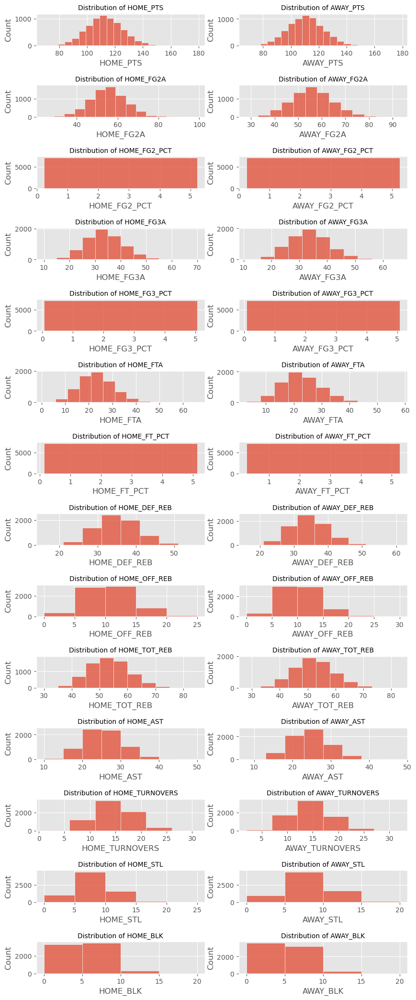

In [45]:
# Plotting a histogram to see the distribution for points scored at home vs away 
rows = 14
cols = 2
k = 0
fig, axes = plt.subplots(nrows=rows,ncols=cols, figsize=(10,26))

for row in range(rows):
    for col in range(cols):
        if col != 1:
            sns.histplot(ax=axes[row,col], data=basketball_data, x=NBA_home_stats_plot[k], binwidth=5)
            axes[row,col].set_title(f'Distribution of {NBA_home_stats_plot[k]}', fontsize=10)
        else:
            sns.histplot(ax=axes[row,col], data=basketball_data, x=NBA_away_stats_plot[k], binwidth=5)
            axes[row,col].set_title(f'Distribution of {NBA_away_stats_plot[k]}', fontsize=10)
    k += 1

fig.subplots_adjust(hspace=1.25)


#### Conclusions:
1. The distribution of points scored at home vs away appears to be nearly identical
2. Away teams appear to attempt more 2pt field goals than home teams
3. Home teams tend to attempt more 3pt field goals than away teams
4. The distribution of defensive rebounds appear to be nearly identical
5. The distribution of assists appear to be slightly more for home teams than away teams
6. Away teams seem to take better care of the ball with fewer games of 20+ turnovers and more games with 10 or less turnovers

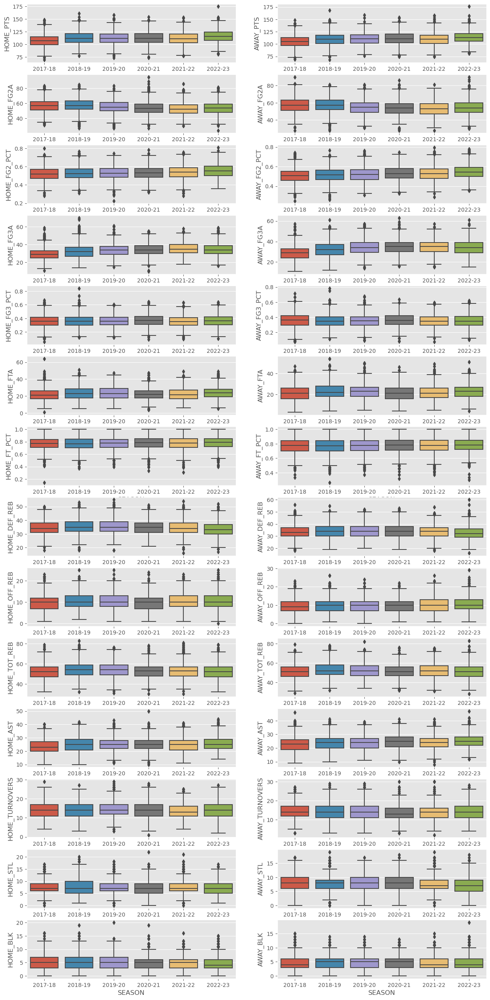

In [46]:
rows = 14
cols = 2
k = 0
fig, axes = plt.subplots(nrows=rows,ncols=cols, figsize=(15,32))

for row in range(rows):
    for col in range(cols):
        if col != 1:
            sns.boxplot(ax=axes[row,col], data=basketball_data, y=NBA_home_stats_plot[k], x='SEASON')
            #axes[row,col].set_title(f'Distribution of {NBA_home_stats_plot[k]}', fontsize=10)
        else:
            sns.boxplot(ax=axes[row,col], data=basketball_data, y=NBA_away_stats_plot[k], x='SEASON')
            #axes[row,col].set_title(f'Distribution of {NBA_away_stats_plot[k]}', fontsize=10)
    k += 1


#### Initial conclusion: 
1. On average, the points scored by teams at home have increased over time. This can indicate that the NBA has slightly shifted to becoming a more offense/fast pace oriented league and moved away from a more defensive and slow-paced approach. 
2. Turnovers, Assist, and Rebounds has stayed about the same over the past 6 NBA seasons.
3. 2 Point FGA has been slightly decreasing while 3 Point FGA has been slightly increasing over the past 6 NBA seasons. This indicates that more NBA teams has been adopting the 3pt shot. 

#### Calculate correlation between each variable / Analyze trends for scattterplots

In [47]:
# Creating a function to generate a subplot of scatterplots
def scatterplot(nba_home_data, nba_away_data, season, x_home='', y_home='', x_away='', y_away='', rows=6, cols=2):
    ''' This function will create a subplot of  
        scatterplots for home vs away stats    
    '''

    k = 0
    fig, axes = plt.subplots(nrows=rows,ncols=cols, figsize=(20,20), constrained_layout=True)

    for row in range(rows):
        for col in range(cols):
            if col == 0:
                sns.scatterplot(ax=axes[row,col], data=nba_home_data[nba_home_data['SEASON'] == season[k]], x=x_home, y=y_home)
                axes[row,col].set_title(f'NBA Season (HOME) {season[k]}', fontsize=10)
                axes[row,col].set_xlabel(x_home)
                axes[row,col].set_ylabel(y_home)

                for index in (nba_home_data[nba_home_data['SEASON'] == season[k]]['HOME'].index):
                    axes[row,col].text(nba_home_data[x_home][index], nba_home_data[y_home][index], nba_home_data['HOME'][index])
            
            else:
                sns.scatterplot(ax=axes[row,col], data=nba_away_data[nba_away_data['SEASON'] == season[k]], x=x_away, y=y_away)
                axes[row,col].set_title(f'NBA Season (AWAY) {season[k]}', fontsize=10)
                axes[row,col].set_xlabel(x_away)
                axes[row,col].set_ylabel(y_away)

                for index in (nba_away_data[nba_away_data['SEASON'] == season[k]]['AWAY'].index):
                    axes[row,col].text(nba_away_data[x_away][index], nba_away_data[y_away][index], nba_away_data['AWAY'][index])
                k += 1
                
    fig.suptitle('Visualizing the trends for stats at Home vs Away for 2017-2018 to 2022-2023 NBA seasons', fontsize=14)


#### Viewing relationships between variables

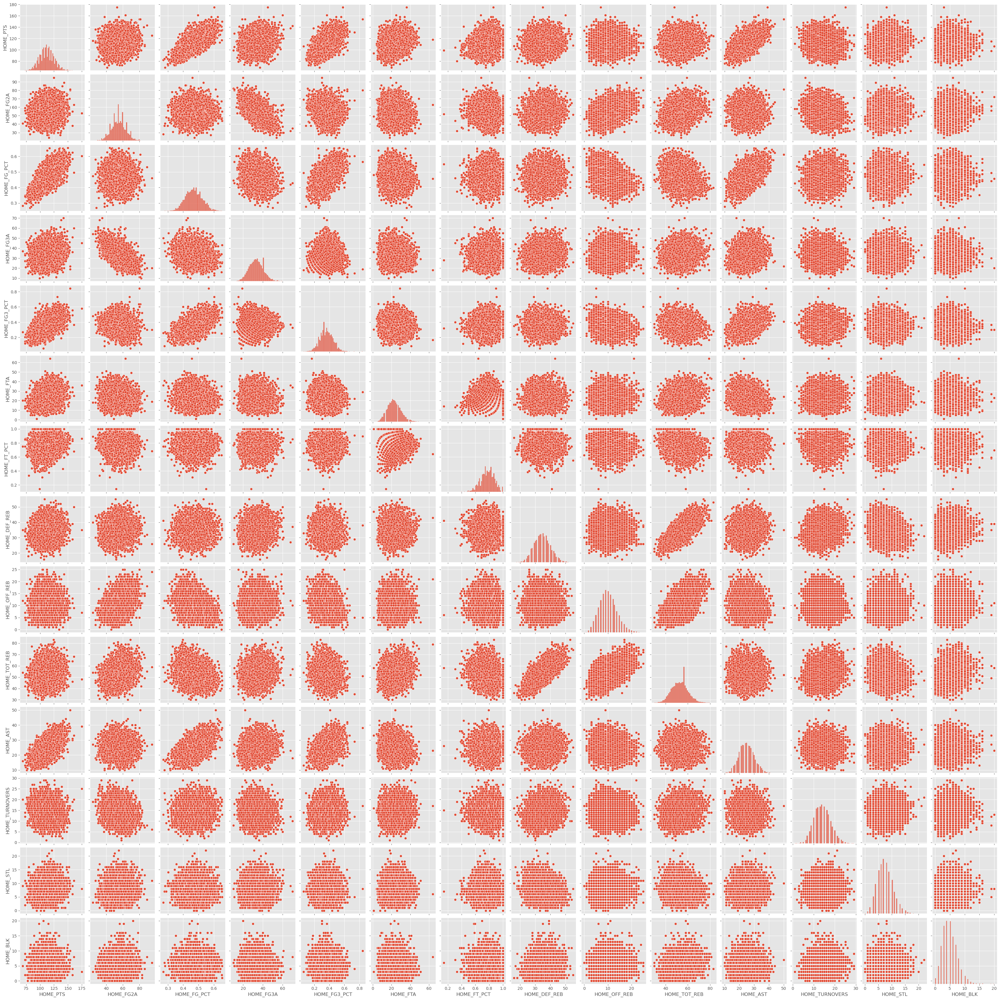

In [40]:
sns.pairplot(basketball_data[NBA_home_stats_plot])

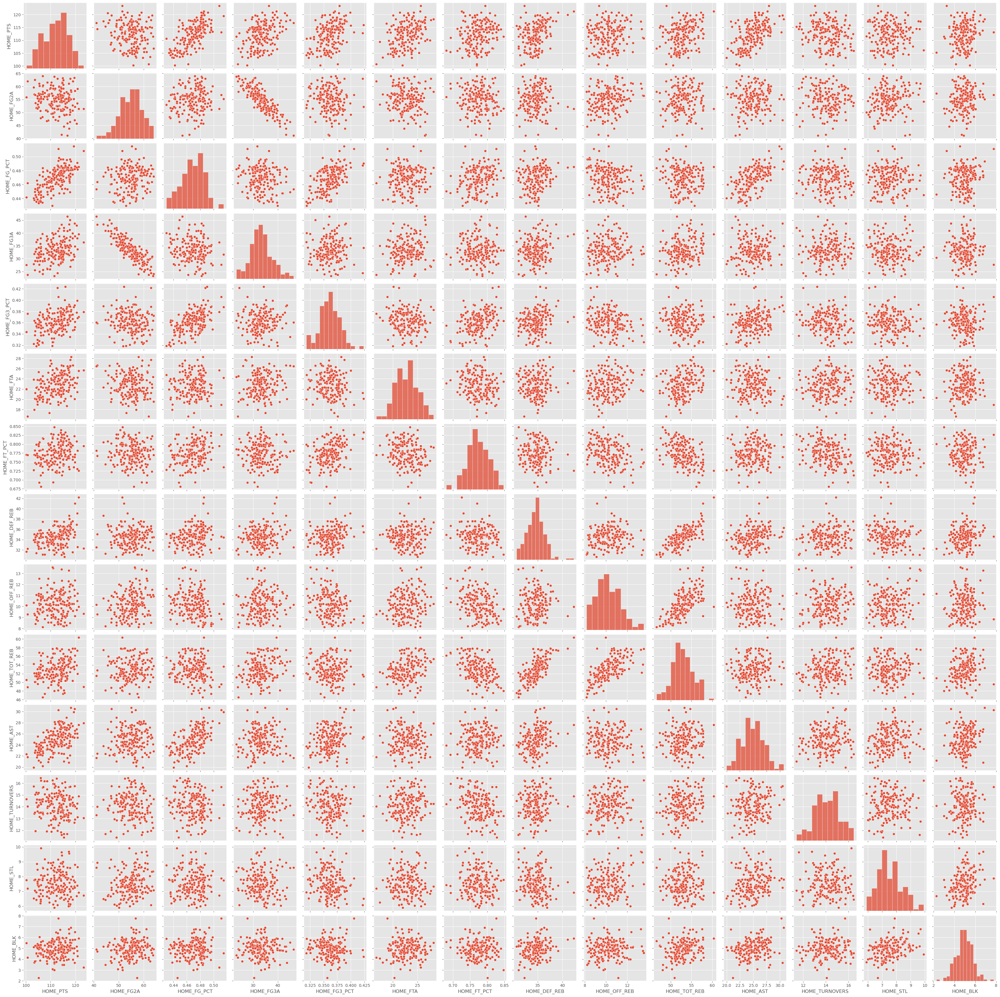

In [41]:
sns.pairplot(home[NBA_home_stats_plot])

Text(0.5, 1.0, 'Correlation for Away Variables')

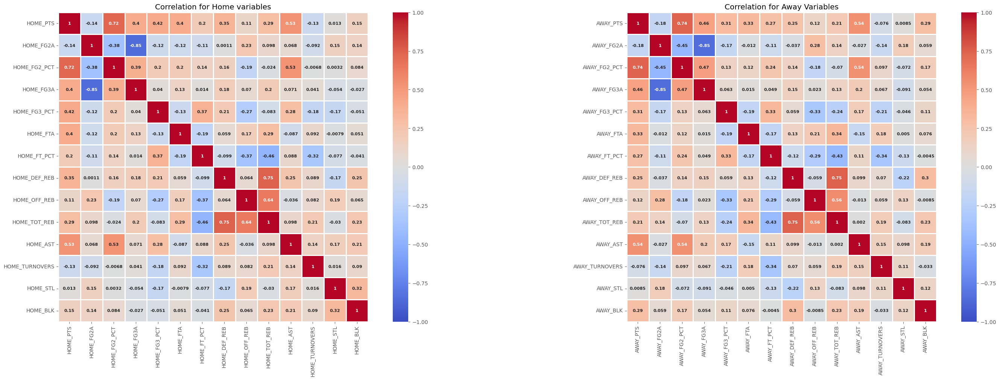

In [55]:
fig, axes = plt.subplots(nrows=1,ncols=2, figsize=(30,10), constrained_layout = True)

sns.heatmap(ax=axes[0], data = home[NBA_home_stats_plot].corr(), vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':8, 'fontweight':'bold'}, square=True, linewidth=1, cmap='coolwarm')
axes[0].set_title("Correlation for Home variables")
sns.heatmap(ax=axes[1], data = away[NBA_away_stats_plot].corr(), vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':8, 'fontweight':'bold'}, square=True, linewidth=1, cmap='coolwarm')
axes[1].set_title("Correlation for Away Variables")

Text(0.5, 1.0, 'Correlation for Away Variables')

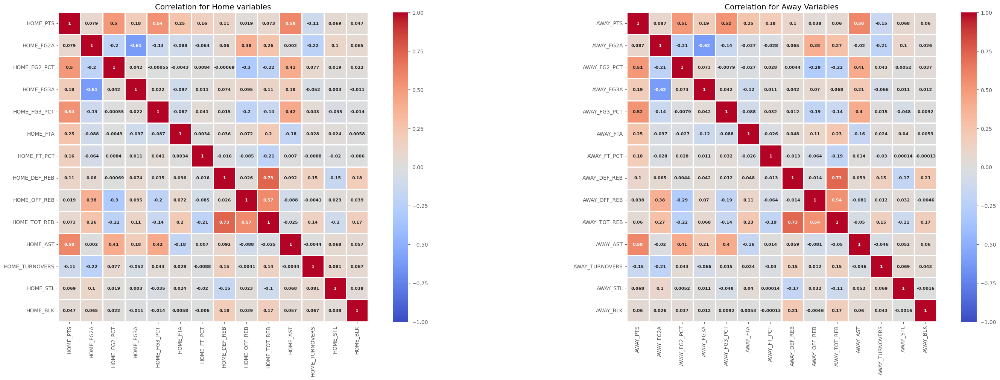

In [56]:
fig, axes = plt.subplots(nrows=1,ncols=2, figsize=(30,10), constrained_layout = True)

sns.heatmap(ax=axes[0], data = basketball_data[NBA_home_stats_plot].corr(), vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':8, 'fontweight':'bold'}, square=True, linewidth=1, cmap='coolwarm')
axes[0].set_title("Correlation for Home variables")
sns.heatmap(ax=axes[1], data = basketball_data[NBA_away_stats_plot].corr(), vmin=-1, vmax=1, annot=True, annot_kws={'fontsize':8, 'fontweight':'bold'}, square=True, linewidth=1, cmap='coolwarm')
axes[1].set_title("Correlation for Away Variables")

In [34]:
home_vs_away_wins_by_month = basketball_data.groupby(['SEASON','YEAR','MONTH',])['W_HOME'].value_counts()

In [55]:
wins_by_month = basketball_data.groupby(['SEASON', 'MONTH'], as_index=False)['W_HOME'].mean()

In [59]:
counts = wins_by_month['W_HOME'].value_counts()

In [103]:
wins_by_month = wins_by_month['W_HOME'].value_counts().reset_index(name='COUNT')

In [61]:
counts.unstack(level=0)

YEAR              2017   2018   2019   2020   2021   2022   2023
MONTH    W_HOME                                                 
April    0         NaN   36.0   36.0    NaN  109.0   36.0   32.0
         1         NaN   52.0   43.0    NaN  131.0   44.0   38.0
August   0         NaN    NaN    NaN   35.0    NaN    NaN    NaN
         1         NaN    NaN    NaN   45.0    NaN    NaN    NaN
December 0        92.0   83.0  103.0   34.0  102.0   91.0    NaN
         1       135.0  136.0  117.0   33.0  107.0  131.0    NaN
February 0         NaN   74.0   68.0   68.0   92.0   84.0   67.0
         1         NaN   86.0   90.0  100.0  120.0   79.0   96.0
January  0         NaN   85.0   94.0  110.0  104.0   96.0   96.0
         1         NaN  131.0  127.0  112.0  118.0  135.0  126.0
July     0         NaN    NaN    NaN    4.0    NaN    NaN    NaN
         1         NaN    NaN    NaN    4.0    NaN    NaN    NaN
March    0         NaN   95.0   90.0   42.0   97.0  104.0  108.0
         1         NaN  127.0  134.0   36.0  107.0  125.0  121.0
May      0         NaN    NaN    NaN    NaN   57.0    NaN    NaN
         1         NaN    NaN    NaN    NaN   78.0    NaN    NaN
November 0        89.0   89.0   86.0    NaN   95.0   84.0    NaN
         1       124.0  130.0  129.0    NaN  130.0  138.0    NaN
October  0        47.0   41.0   27.0    NaN   44.0   38.0    NaN
         1        57.0   69.0   41.0    NaN   49.0   64.0    NaN

In [105]:
test = wins_by_month['W_HOME'].mean()

In [14]:
home_wins = wins_by_month.unstack(1, fill_value=0)

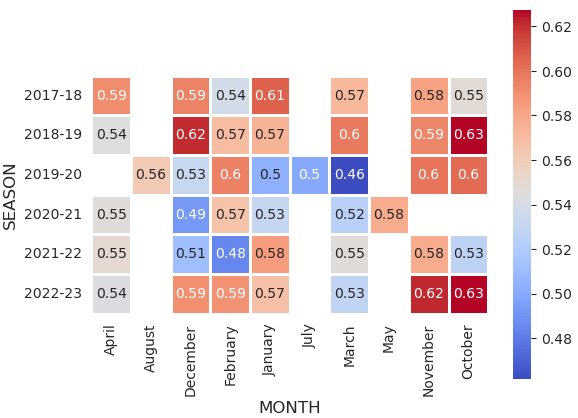

In [20]:
with sns.axes_style('white'):
    sns.heatmap(home_wins, annot=True, linewidths=2, mask=home_wins.values == 0, cmap='coolwarm', square=True)


In [21]:
wins_by_month_away = basketball_data.groupby(['SEASON', 'MONTH'])['W_AWAY'].mean()

In [25]:
away_wins = wins_by_month_away.unstack(1, fill_value=0)

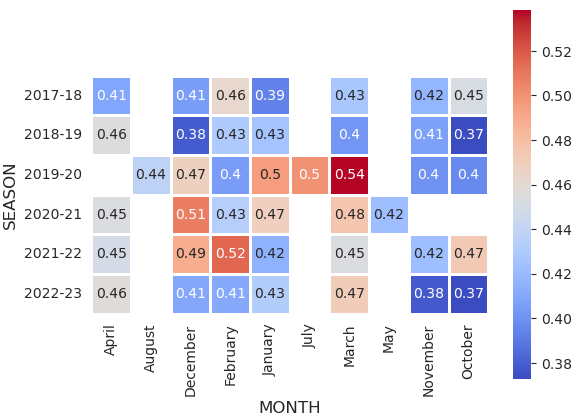

In [26]:
with sns.axes_style('white'):
    sns.heatmap(away_wins, annot=True, linewidths=2, mask=away_wins.values == 0, cmap='coolwarm', square=True)

In [135]:
home_teams_data = basketball_data.groupby(['SEASON', 'MONTH', 'HOME'],as_index=False)['W_HOME'].mean()
away_teams_data = basketball_data.groupby(['SEASON', 'MONTH', 'AWAY'],as_index=False)['W_AWAY'].mean()

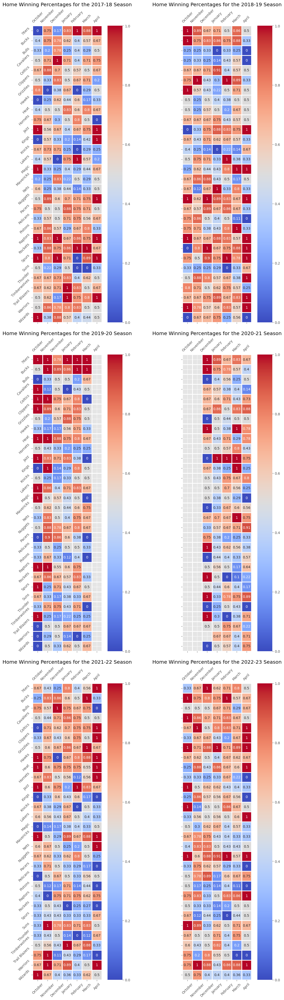

In [163]:
rows = len(NBA_seasons)-3
cols = 2
home_cols = ['October', 'November', 'December', 'January', 'February', 'March', 'April']

fig, axes = plt.subplots(nrows=rows,ncols=cols, figsize=(12,40), constrained_layout = True, sharex=True, sharey=True)
for i, ax in enumerate(axes.flat):
    home_data = home_teams_data[home_teams_data['SEASON'] == NBA_seasons[i]].reset_index(drop=True).pivot(index=['HOME'], columns='MONTH', values='W_HOME')
    home_data = home_data.reindex(columns=home_cols)
    sns.heatmap(ax=ax, data=home_data, linewidths=1, cmap='coolwarm', square=True, annot=True)
    ax.title.set_text(f'Home Winning Percentages for the {NBA_seasons[i]} Season')
    ax.tick_params(labeltop=True, labelrotation=45)
    ax.set_xlabel('')
    ax.set_ylabel('')

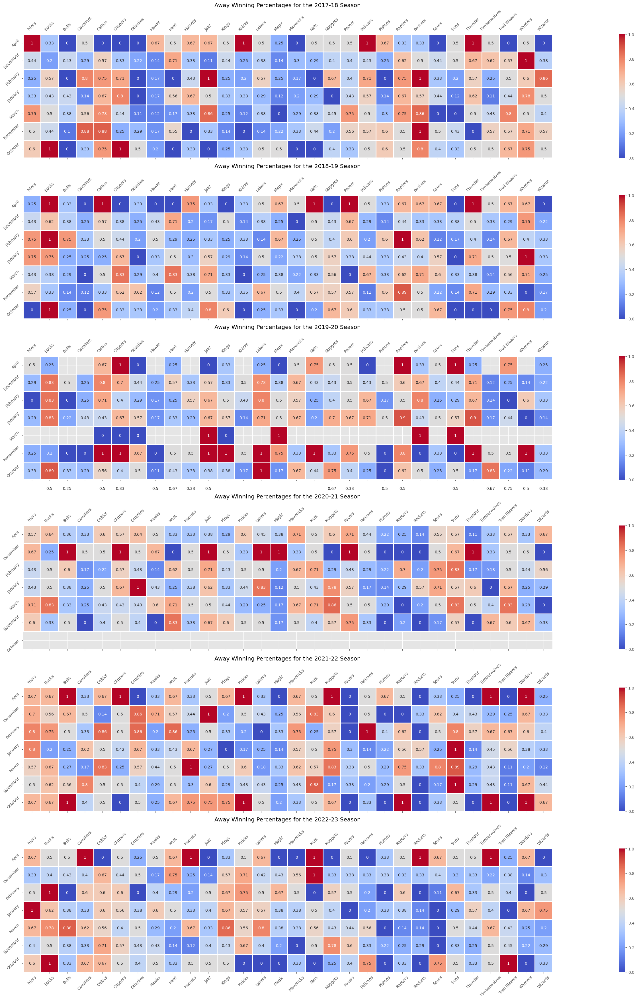

In [137]:
rows = len(NBA_seasons)
cols = 1
away_cols = ['October', 'November', 'December', 'January', 'February', 'March', 'April']

fig, axes = plt.subplots(nrows=rows,ncols=cols, figsize=(50,35), constrained_layout = True, sharex=True, sharey=True)
for i, ax in enumerate(axes.flat):
    away_data = away_teams_data[away_teams_data['SEASON'] == NBA_seasons[i]].reset_index(drop=True).pivot(index=['MONTH'], columns='AWAY', values='W_AWAY')
    away_data = away_data.reindex(columns=home_cols)

    sns.heatmap(ax=ax, data=away_data, linewidths=1, cmap='coolwarm', square=True, annot=True)
    ax.title.set_text(f'Away Winning Percentages for the {NBA_seasons[i]} Season')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(labeltop=True, labelrotation=45)

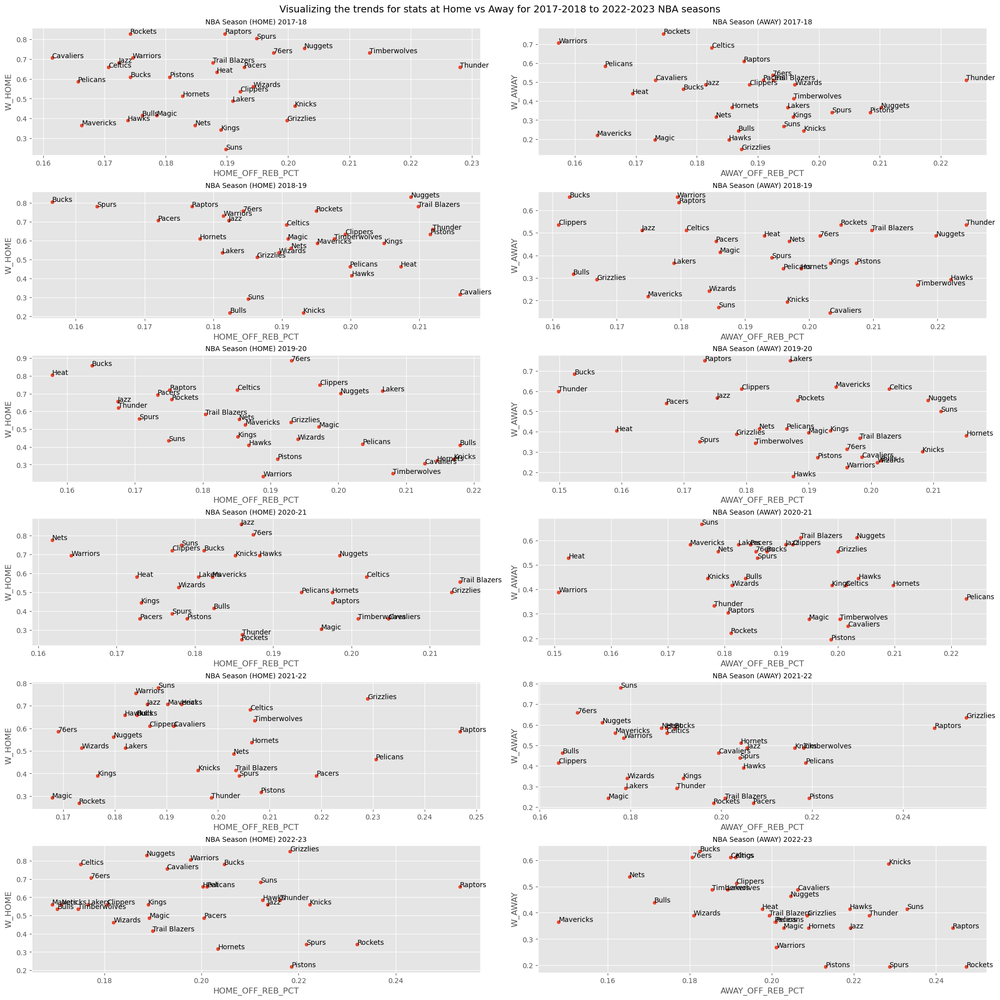

In [23]:
scatterplot(home, away, NBA_seasons, x_home='HOME_OFF_REB_PCT', y_home = 'W_HOME', x_away='AWAY_OFF_REB_PCT', y_away='W_AWAY')